<h1>David Mosciszko, James Fell, and Jerry Zheng </h1>

## Reverse Image Search - Baseline PCA with KNN


In [ ]:
#source: https://github.com/leelamanikanta/Reverse_Image_Search
import cv2 as cv
import dlib
import requests
import os
import numpy as np
import tarfile
from numpy.linalg import norm
import joblib as pickle
from tqdm import tqdm
import os
import PIL
import time
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import gc
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
import math
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.decomposition import PCA

#Database Setup:

In [ ]:
url = 'http://vis-www.cs.umass.edu/lfw/lfw.tgz'
r = requests.get(url)
filename = 'lfw.tgz'
foldername = filename.split('.')[0]
open(filename , 'wb').write(r.content)

tar = tarfile.open(filename, "r:gz")
tar.extractall()
tar.close()

#Resnet50
<p>
Now we use Resnet50 model which is trained on the imagenet dataset (http://www.image-net.org/)
to extract the features from the images. In other words we will convert the images in the dataset to feature vectors using Resnet50.
It converts images into 2048 convolutional features compared to 25088
features in vgg 19 or 51200 features in inception architectures. It will be easy for the nearest neighbor algorithm to find neighbors
and also it will minimize the effects of Curse of dimensionality. https://en.wikipedia.org/wiki/Curse_of_dimensionality
</p>

In [ ]:
img_size = 224

#The following is a Resnet50 model without the top layers so we get convolutional features as output instead of the image classification probability.

model = ResNet50(weights="imagenet", include_top=False,input_shape=(img_size, img_size, 3),pooling='max')

#Create the keras image data generator object and extract the features for the images using Resnet50 predict_generator method.

batch_size = 64
root_dir = 'lfw'

img_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

datagen = img_gen.flow_from_directory(root_dir, target_size=(img_size, img_size), batch_size=batch_size, class_mode=None, shuffle=False)

num_images = len(datagen.filenames)
num_epochs = int(math.ceil(num_images / batch_size))

feature_list = model.predict_generator(datagen, num_epochs)

#We have 13233 images in our dataset. Each image is converted into a 2048 feature vector

print("Num images   = ", len(datagen.classes))
print("Shape of feature_list = ", feature_list.shape)

# Get full path for all the images in our dataset

filenames = [root_dir + '/' + s for s in datagen.filenames]

#We will fit the nearest neighbor algorithm to the extracted features. We have picked kd_tree algorithm.

neighbors = NearestNeighbors(n_neighbors=20, algorithm='kd_tree', metric='euclidean')
neighbors.fit(feature_list)

94781440/94765736 [==============================] - 1s 0us/step
Found 13233 images belonging to 5749 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.


Num images   =  13233
Shape of feature_list =  (13233, 2048)


NearestNeighbors(algorithm='kd_tree', metric='euclidean', n_neighbors=20)

#Format Predictions for Printing

In [ ]:
def similar_images(indices):
    plt.figure(figsize=(15,10), facecolor='white')
    plotnumber = 1    
    for index in indices:
        if plotnumber<=len(indices) :
            #5,4 so we can show 20 predictions
            ax = plt.subplot(5,4,plotnumber)
            plt.imshow(mpimg.imread(filenames[index]), interpolation='lanczos')            
            plotnumber+=1
    plt.tight_layout()

#Main Function for Predictions

In [ ]:
def predict_face(url, path):
  #Take image from url, load into PILLOW format
  img_url = url
  response = requests.get(img_url)
  img_path = path
  open(img_path, 'wb').write(response.content)

  input_shape = (img_size, img_size, 3)

  img = image.load_img(img_path, target_size=(input_shape[0], input_shape[1]))
  img_array = image.img_to_array(img)
  expanded_img_array = np.expand_dims(img_array, axis=0)
  preprocessed_img = preprocess_input(expanded_img_array)

  #print(preprocessed_img.shape)
  #Make predictions
  test_img_features = model.predict(preprocessed_img, batch_size=1)

  _, indices = neighbors.kneighbors(test_img_features)

  #print(indices.shape)

  #Plot predictions

  plt.imshow(mpimg.imread(img_path), interpolation='lanczos')
  plt.xlabel(img_path.split('.')[0] + '_Original Image',fontsize=20)
  plt.show()

  print('********* Predictions (without PCA) ***********')
  similar_images(indices[0])


  #Perform principle component analysis

  pca = PCA(n_components=100)
  pca.fit(feature_list)
  compressed_features = pca.transform(feature_list)

  neighbors_pca_features = NearestNeighbors(n_neighbors=20, algorithm='kd_tree', metric='euclidean').fit(compressed_features)

  test_img_compressed = pca.transform(test_img_features)
  distances, indices = neighbors_pca_features.kneighbors(test_img_compressed)

  #print(indices.shape)

  #Plot predictions

  plt.imshow(mpimg.imread(img_path), interpolation='lanczos')
  plt.xlabel(img_path.split('.')[0] + '_Original Image',fontsize=20)
  plt.show()
  
  print('********* Predictions (with PCA) ***********')
  similar_images(indices[0])


#Albert Costa

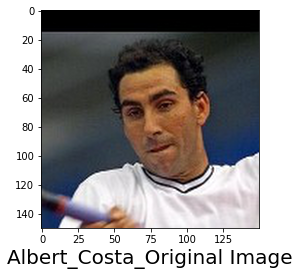

********* Predictions (without PCA) ***********


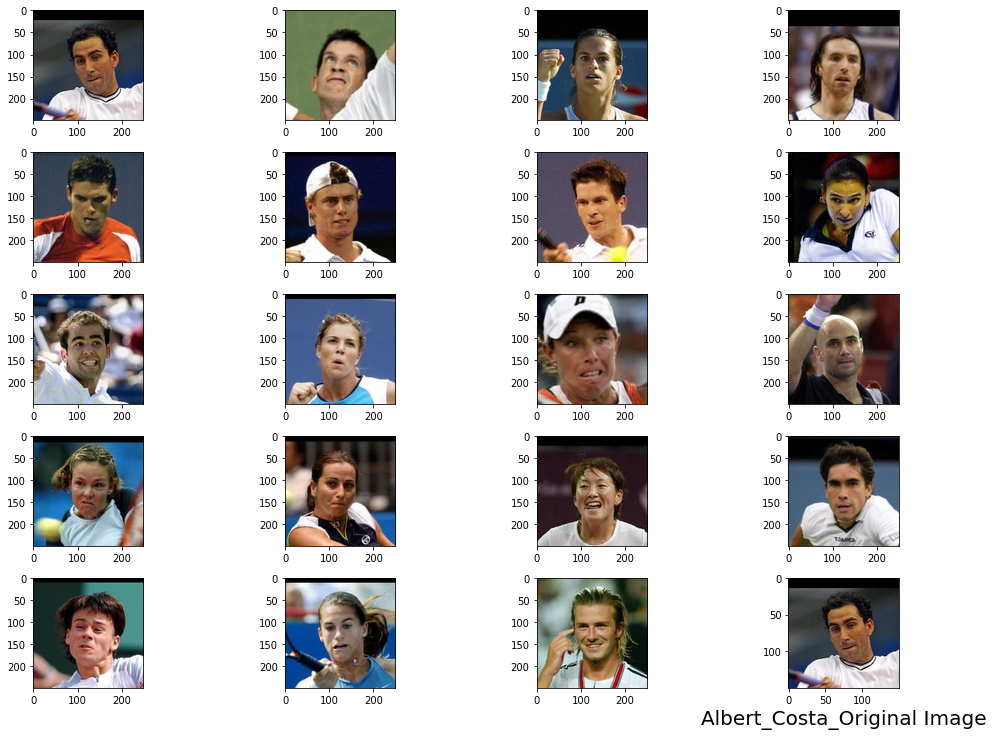

********* Predictions (with PCA) ***********


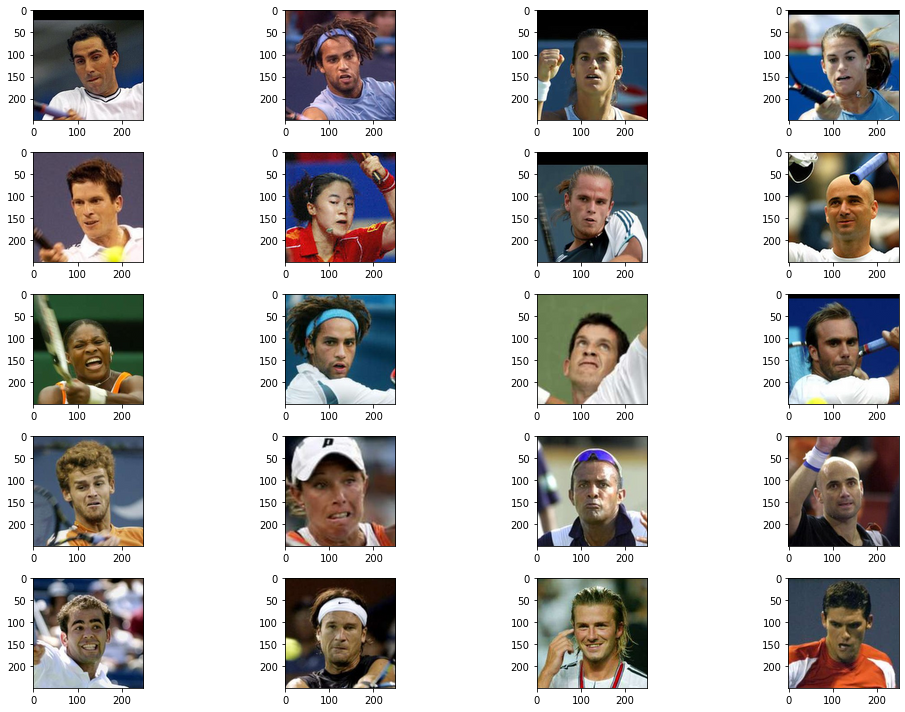

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Albert_Costa.jpg'
img_path = 'Albert_Costa.jpg'
predict_face(img_url, img_path)

#Angela Bassett

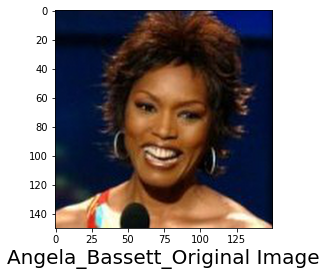

********* Predictions (without PCA) ***********


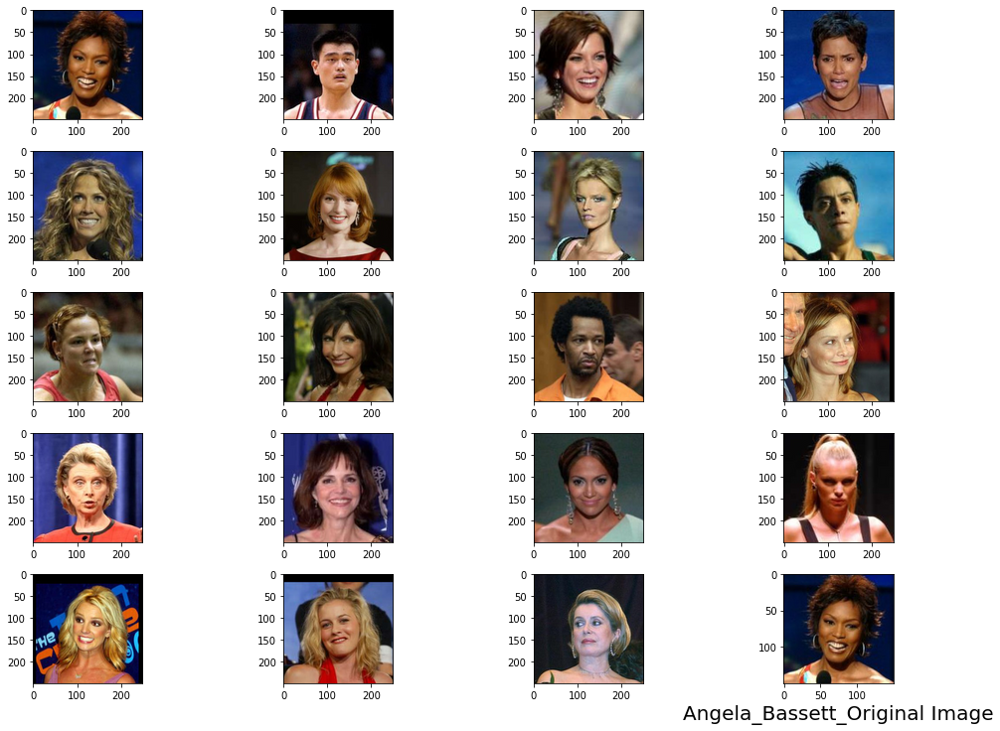

********* Predictions (with PCA) ***********


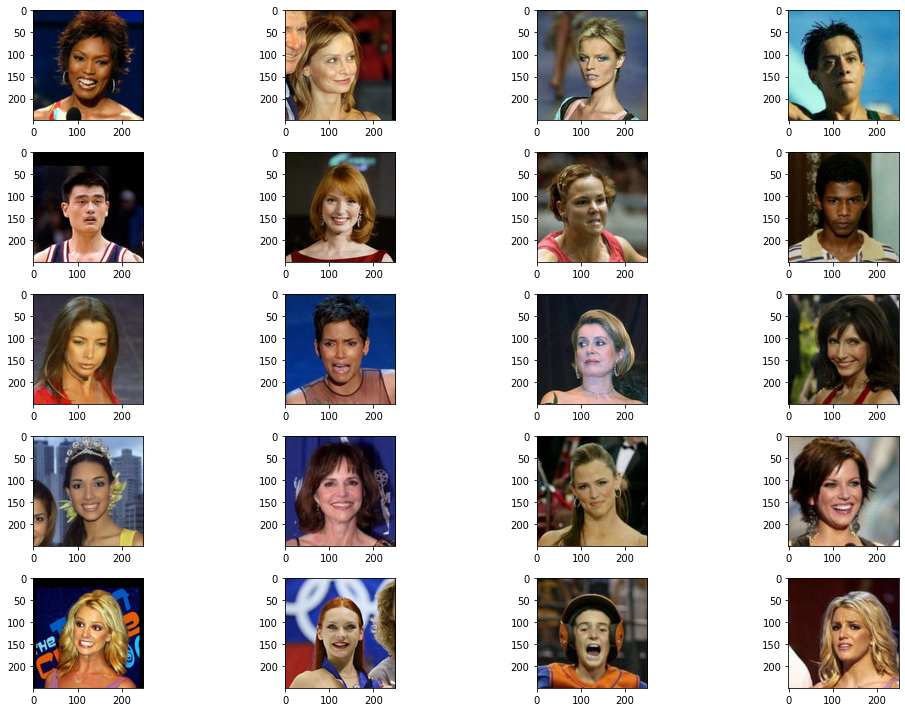

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Angela_Bassett.jpg'
img_path = 'Angela_Bassett.jpg'
predict_face(img_url, img_path)

#Arminio Fraga 

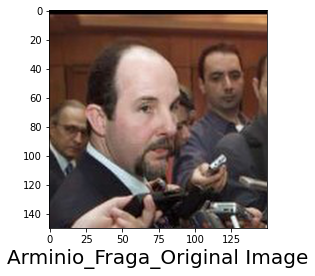

********* Predictions (without PCA) ***********


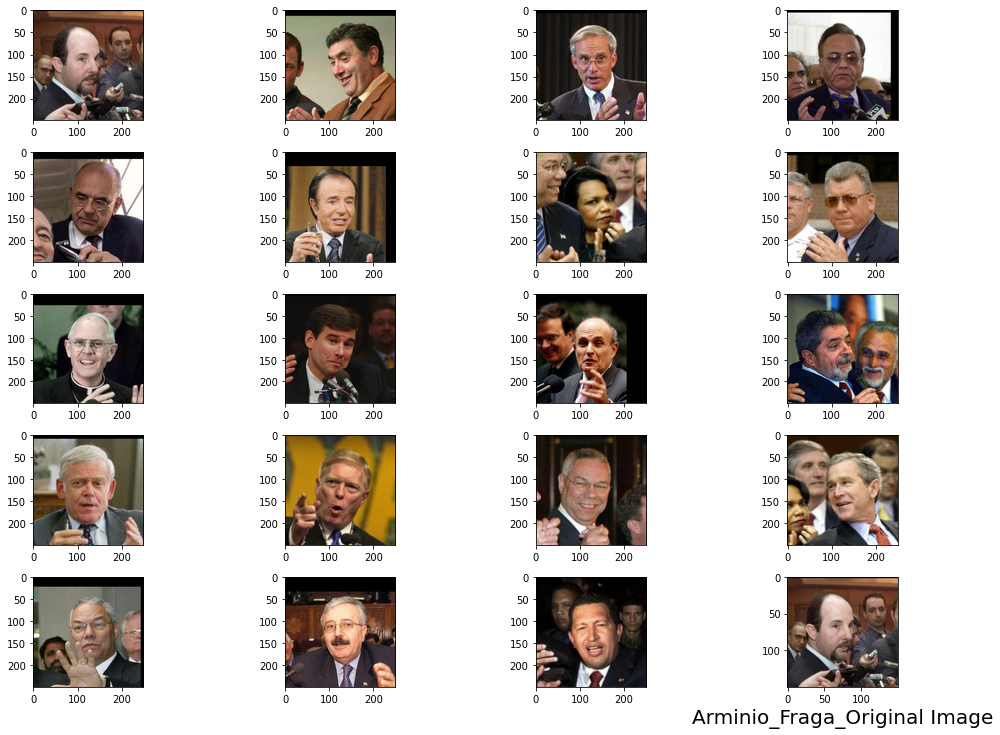

********* Predictions (with PCA) ***********


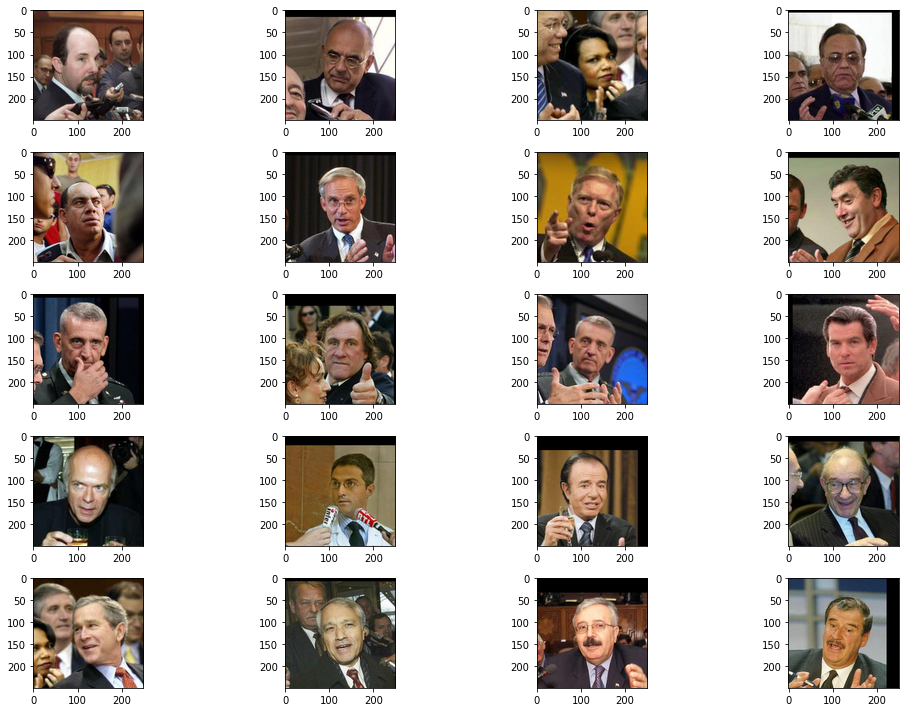

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Arminio_Fraga.jpg'
img_path = 'Arminio_Fraga.jpg'
predict_face(img_url, img_path)

#Billy Crystal

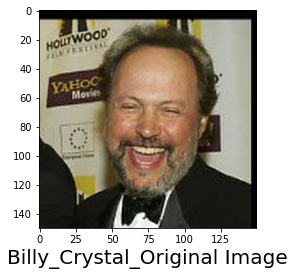

********* Predictions (without PCA) ***********


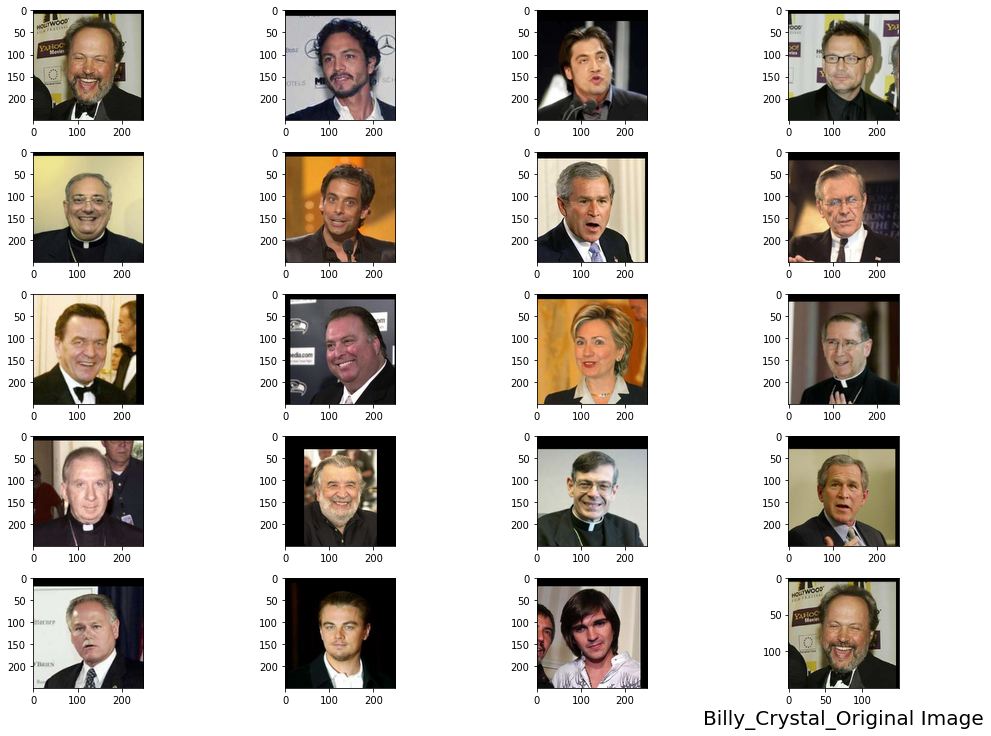

********* Predictions (with PCA) ***********


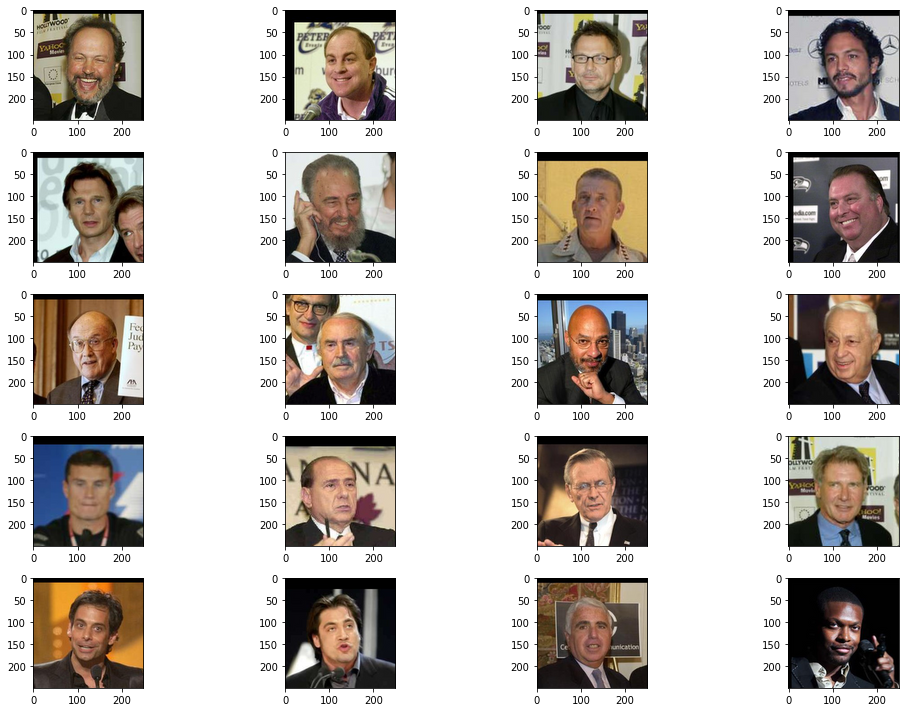

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Billy_Crystal.jpg'
img_path = 'Billy_Crystal.jpg'
predict_face(img_url, img_path)

#Bob Graham

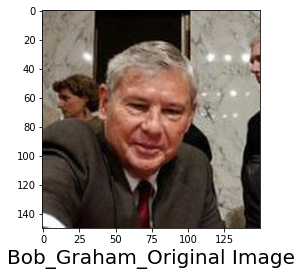

********* Predictions (without PCA) ***********


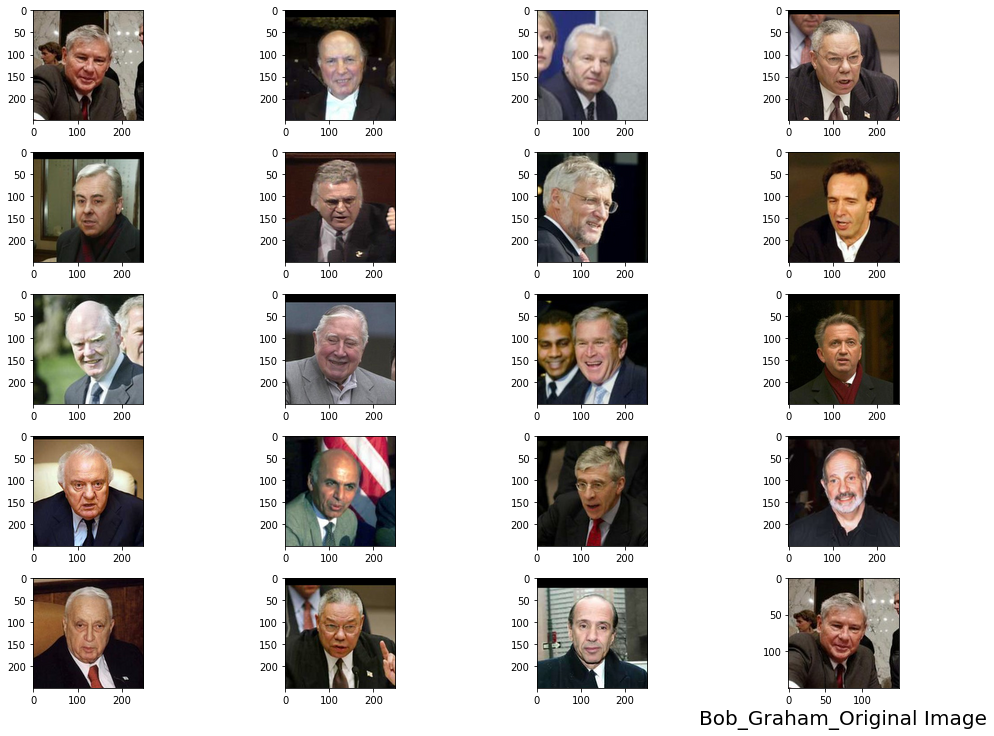

********* Predictions (with PCA) ***********


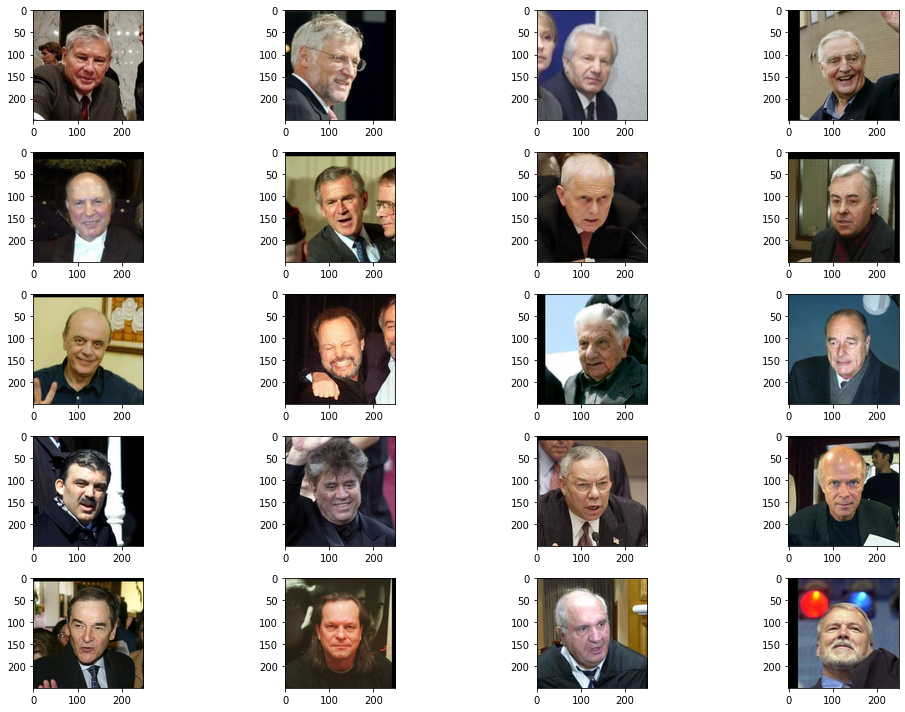

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Bob_Graham.jpg'
img_path = 'Bob_Graham.jpg'
predict_face(img_url, img_path)

#Borris Becker

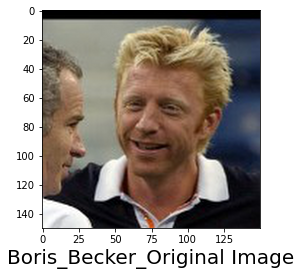

********* Predictions (without PCA) ***********


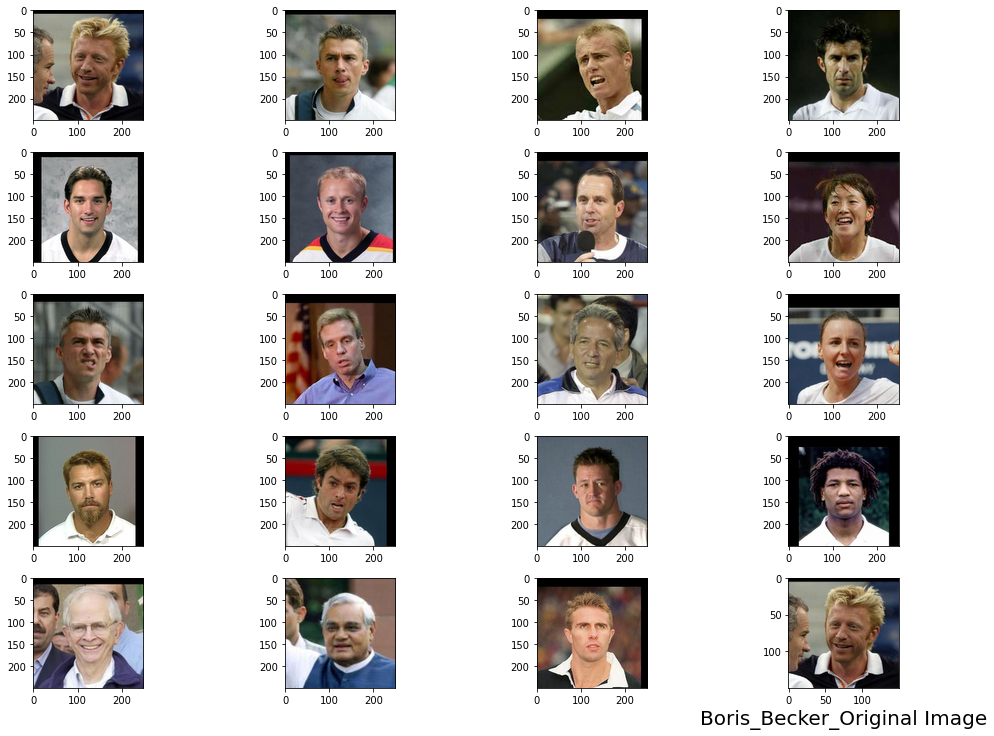

********* Predictions (with PCA) ***********


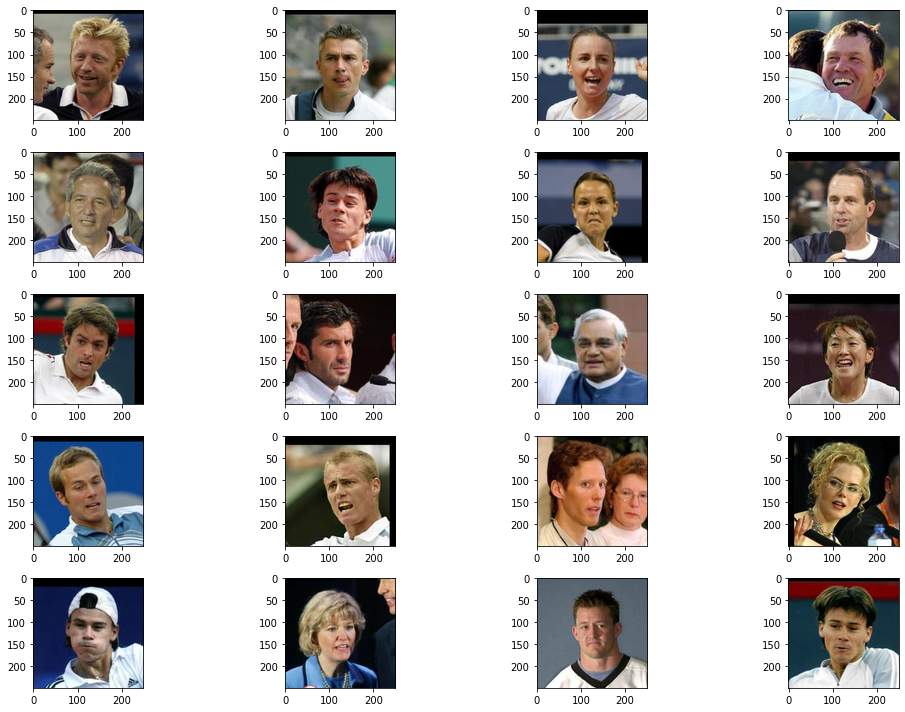

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Boris_Becker.jpg'
img_path = 'Boris_Becker.jpg'
predict_face(img_url, img_path)

#Bulent Ecevit

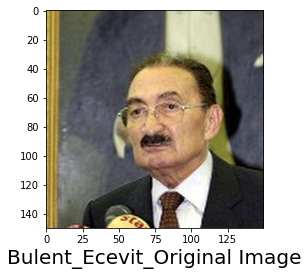

********* Predictions (without PCA) ***********


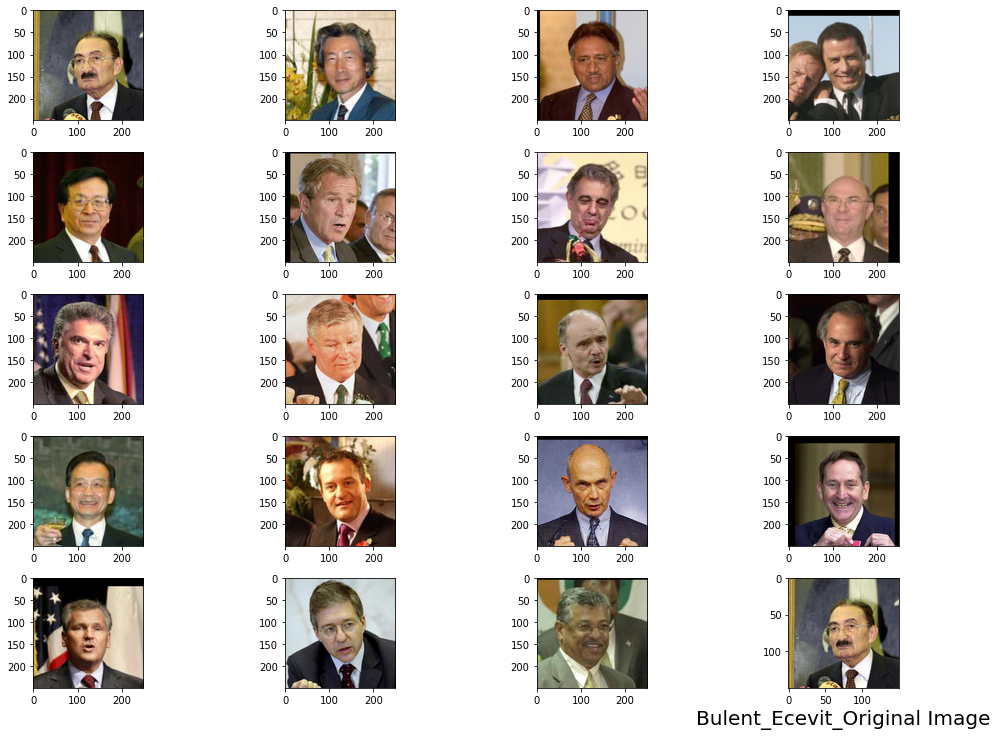

********* Predictions (with PCA) ***********


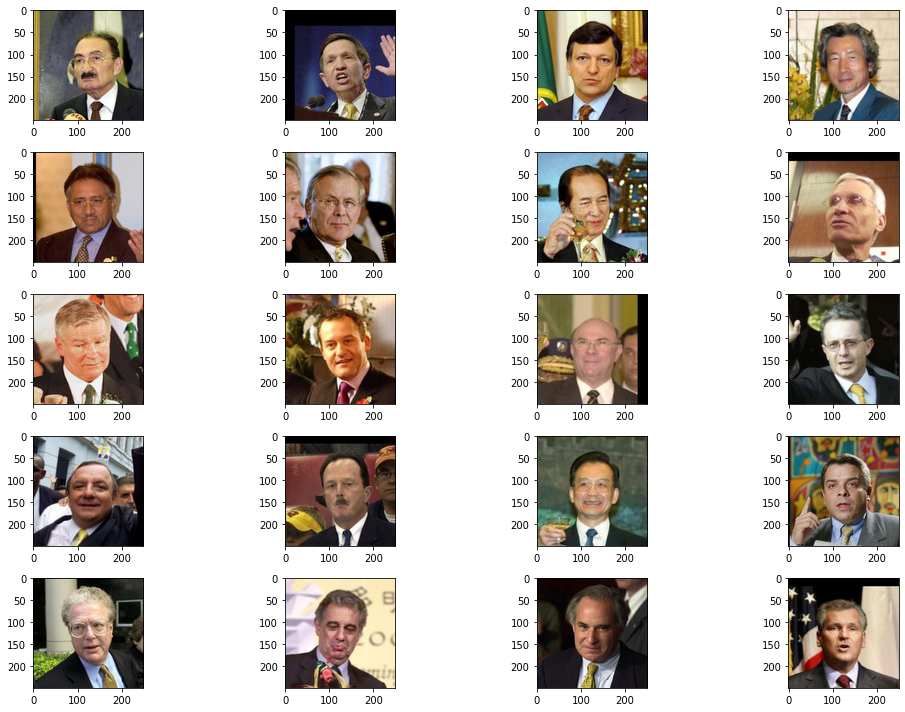

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Bulent_Ecevit.jpg'
img_path = 'Bulent_Ecevit.jpg'
predict_face(img_url, img_path)

#Calista Flockhart

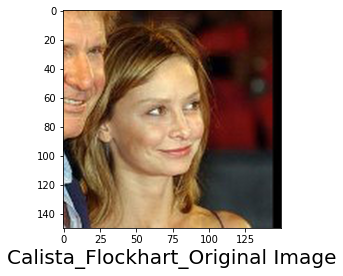

********* Predictions (without PCA) ***********


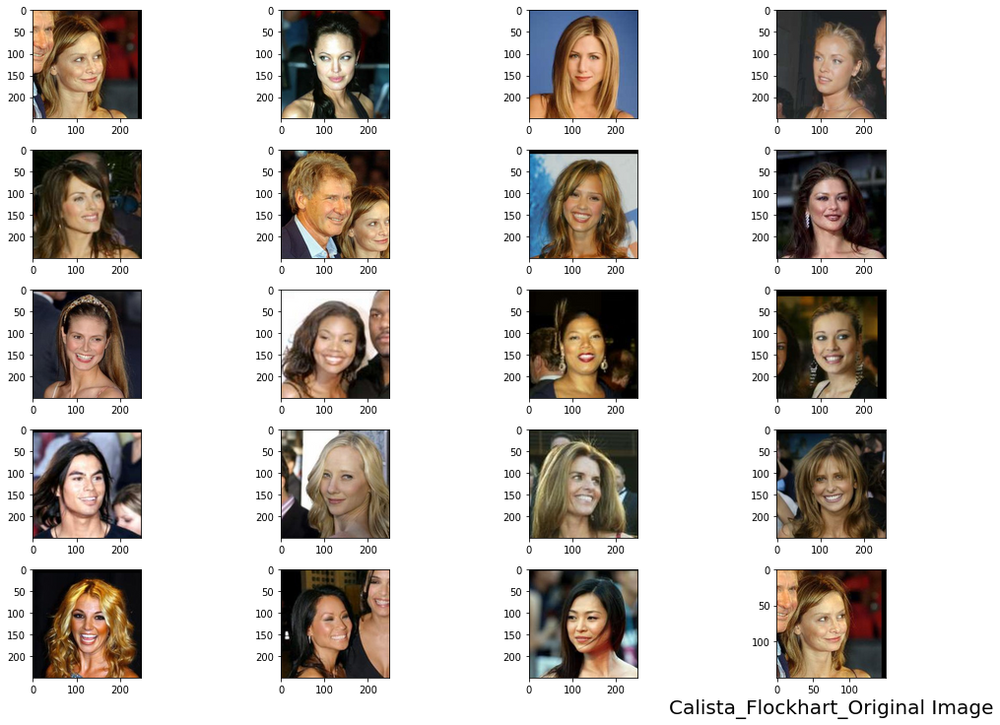

********* Predictions (with PCA) ***********


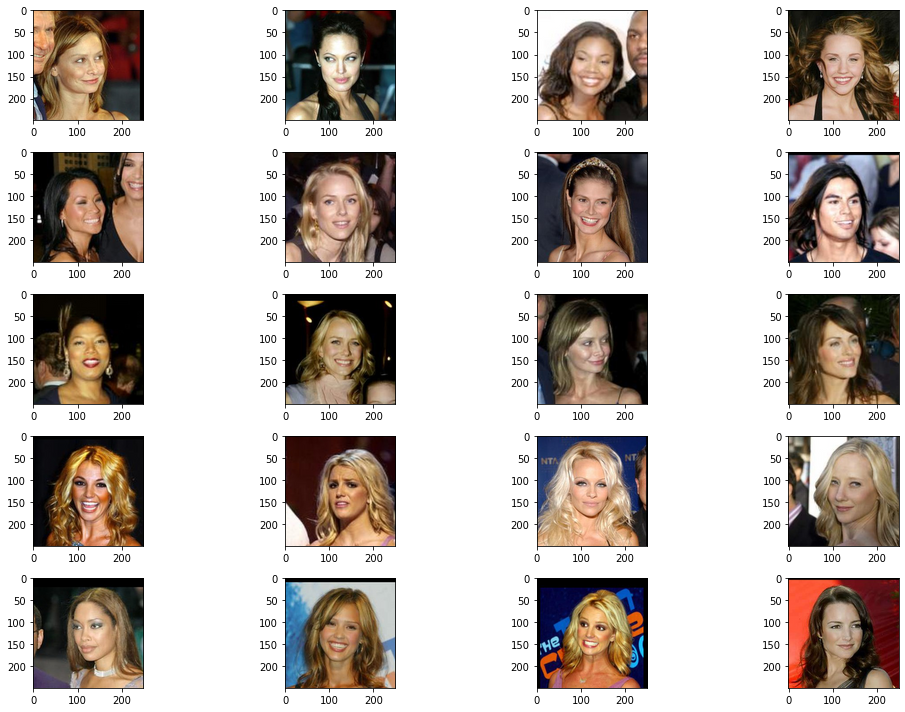

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Calista_Flockhart.jpg'
img_path = 'Calista_Flockhart.jpg'
predict_face(img_url, img_path)

#Cameron Diaz

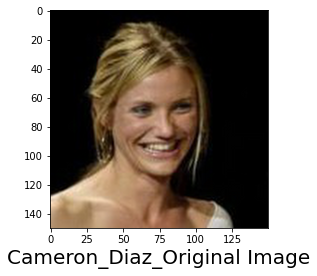

********* Predictions (without PCA) ***********


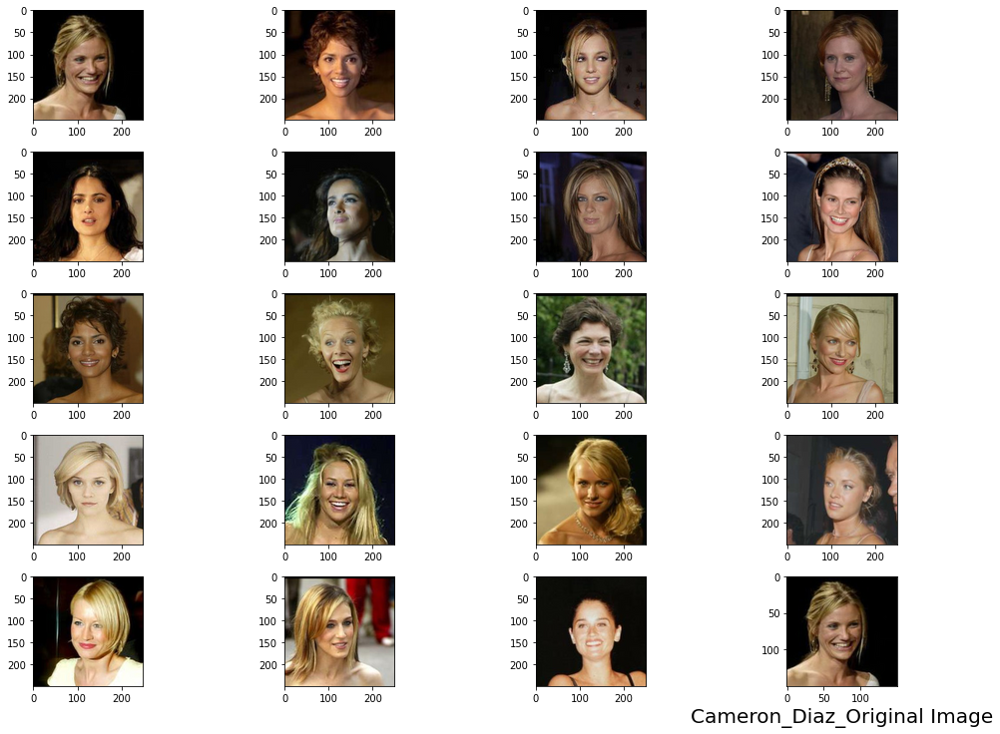

********* Predictions (with PCA) ***********


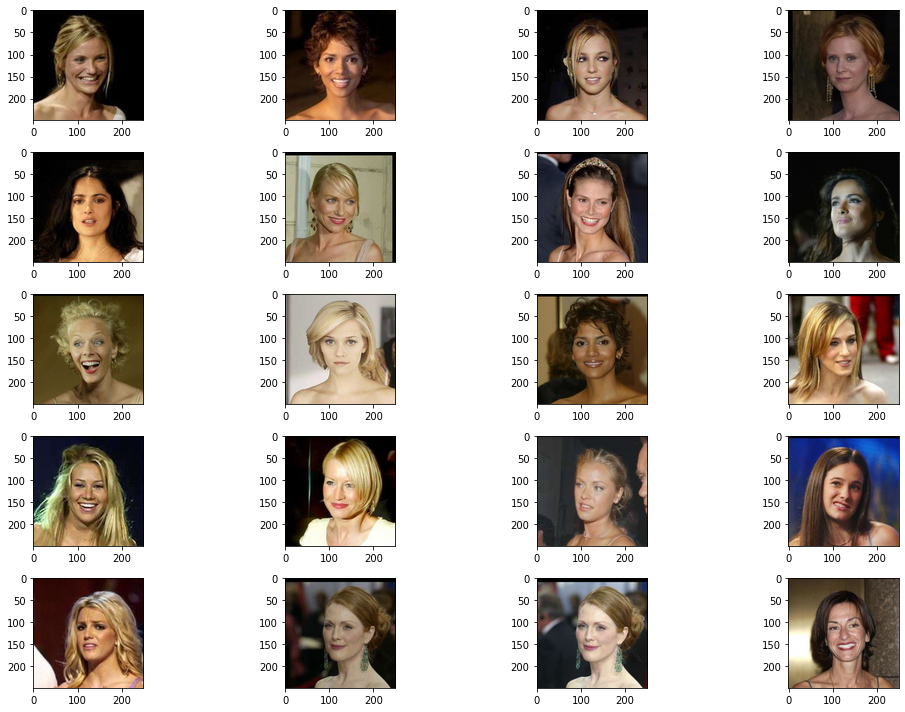

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Cameron_Diaz.jpg'
img_path = 'Cameron_Diaz.jpg'
predict_face(img_url, img_path)

#Carmen Electra

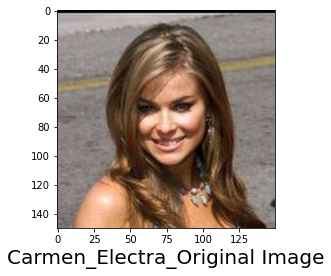

********* Predictions (without PCA) ***********


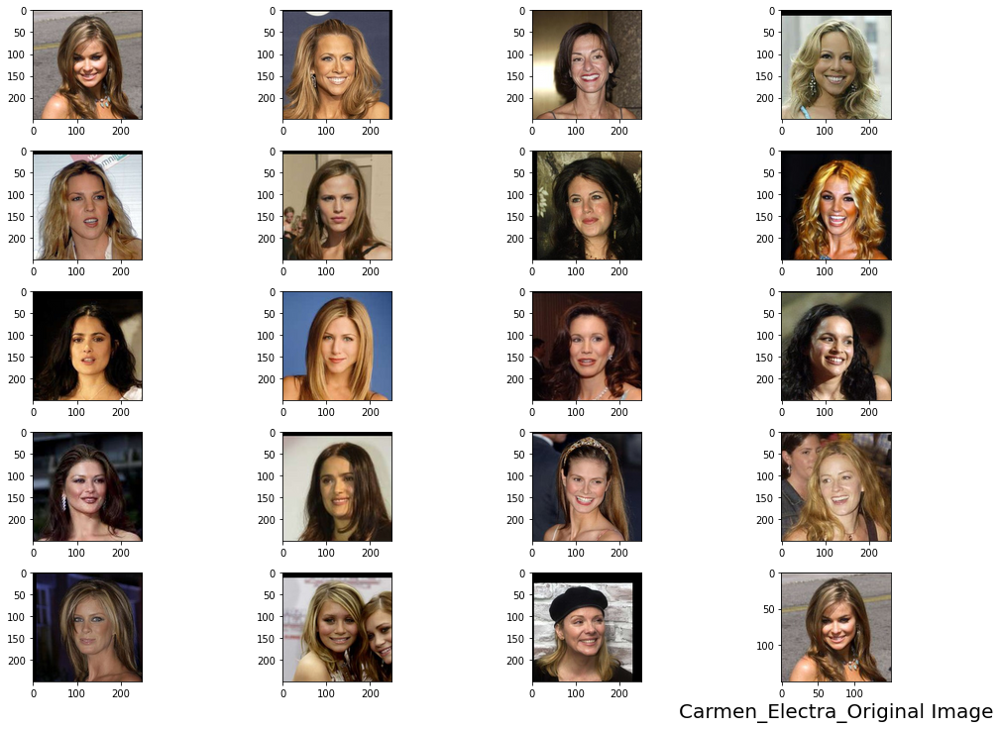

********* Predictions (with PCA) ***********


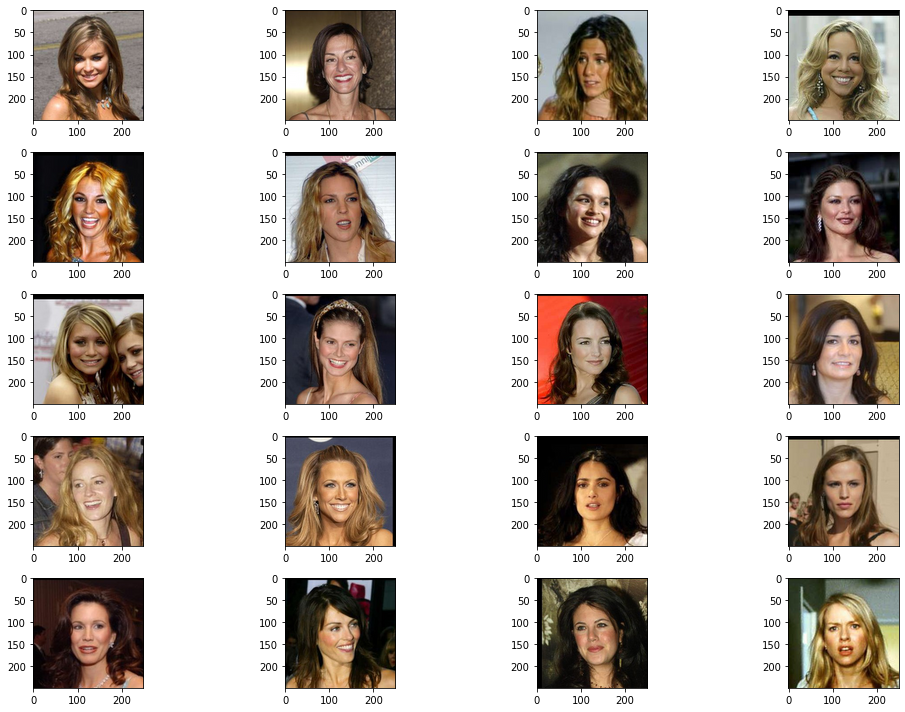

In [ ]:
img_url = 'https://raw.githubusercontent.com/jerryz18/CS370/main/Carmen_Electra.jpg'
img_path = 'Carmen_Electra.jpg'
predict_face(img_url, img_path)

#Results

Just by using KNN with the kd-tree algorithm and PCA, only similar images were found for each of the test cases.  Whether it be a tennis athelte, an old caucasian man, or a female with short hair, this did pretty good finding similar images, but not the same faces.  For our improvement of this we will be using Facenet. 

## Reverse Image Search Improvement Using Facenet

In [ ]:
!wget   http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 # DOWNLOAD LINK

!bunzip2 /content/shape_predictor_68_face_landmarks.dat.bz2

datFile =  "/content/shape_predictor_68_face_landmarks.dat"

--2022-04-27 17:36:01--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  27.8MB/s    in 2.2s    

2022-04-27 17:36:03 (27.8 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



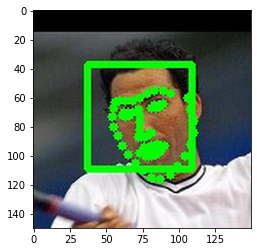

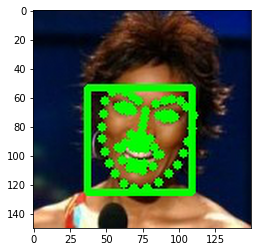

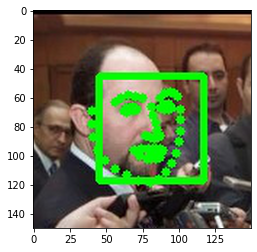

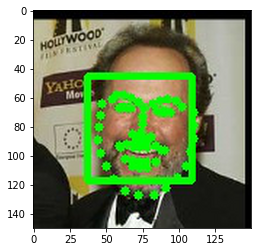

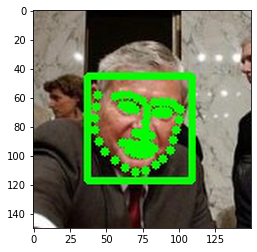

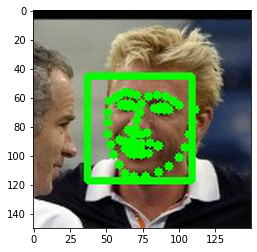

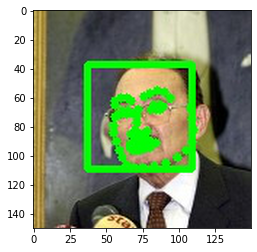

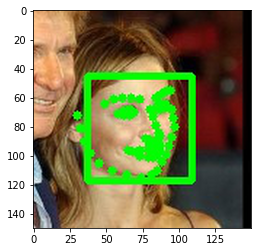

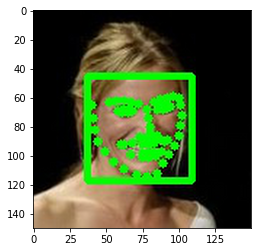

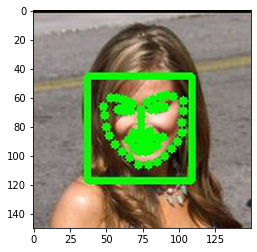

In [ ]:
#Source: https://livecodestream.dev/post/detecting-face-features-with-python/
#Draw box over dataset
import dlib

def get_features(filename, num):
  # Load the detector
  detector = dlib.get_frontal_face_detector()

  predictor = dlib.shape_predictor(datFile)

  # read the image
  img = cv.imread(filename)

  # Convert image into grayscale
  gray = cv.cvtColor(src=img, code=cv.COLOR_BGR2GRAY)

  # Use detector to find landmarks
  faces = detector(gray)

  for face in faces:
      x1 = face.left() # left point
      y1 = face.top() # top point
      x2 = face.right() # right point
      y2 = face.bottom() # bottom point
      # Draw a rectangle
      rect_image = cv.rectangle(img=img, pt1=(x1, y1), pt2=(x2, y2), color=(0, 255, 0), thickness=4)

      # Create landmark object
      landmarks = predictor(image=gray, box=face)

      # Loop through all the points
      for n in range(0, 68):
         x = landmarks.part(n).x
         y = landmarks.part(n).y

          # Draw a circle
         circle_img = cv.circle(img= img, center=(x, y), radius=3, color=(0, 255, 0), thickness=-1)

      if (num == 0):
        img_path = 'Albert_Costa_Face.jpg'
      elif (num == 1):
        img_path = 'Angela_Bassett_Face.jpg'
      elif (num == 2):
        img_path = 'Arminio_Fraga_Face.jpg'
      elif (num == 3):
        img_path = 'Billy_Crystal_Face.jpg'
      elif (num == 4):
        img_path = 'Bob_Graham_Face.jpg'
      elif (num == 5):
        img_path = 'Boris_Becker_Face.jpg'
      elif (num == 6):
        img_path = 'Bulent_Ecevit_Face.jpg'
      elif (num == 7):
        img_path = 'Calista_Flockhart_Face.jpg'
      elif (num == 8):
        img_path = 'Cameron_Diaz_Face.jpg'
      elif (num == 9):
        img_path = 'Carmen_Electra_Face.jpg'
      
      #cv.imwrite(img_path,circle_img)
      cv.imwrite(img_path,rect_image)

  # show the image

  plt.imshow(mpimg.imread(img_path), interpolation='lanczos')
  plt.show()

get_features('Albert_Costa.jpg', 0)
get_features('Angela_Bassett.jpg', 1)
get_features('Arminio_Fraga.jpg', 2)
get_features('Billy_Crystal.jpg', 3)
get_features('Bob_Graham.jpg', 4)
get_features('Boris_Becker.jpg', 5)
get_features('Bulent_Ecevit.jpg', 6)
get_features('Calista_Flockhart.jpg', 7)
get_features('Cameron_Diaz.jpg', 8)
get_features('Carmen_Electra.jpg', 9)


In this faceNet model, we were able to capture only the face and make a cluster from that, allowing for a more precise model when detecting faces. In the code above, we were able to create facial embeddings for each test case.

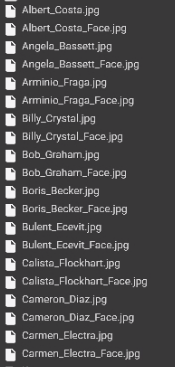

For a fully functional facial search system, we would have to detect these facial embeddings for every face in the dataset, and then train our Resnet50 model that we used in our original solution on these embeddings. This would have predicted just about every face of the test image's person for their predictions. Unfortunately our group ran into many problems trying to train multiple CNNs on our data (Resnet50, MTCNN, also Dlib CNN).